In [1]:
import torch
import sklearn
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import math

from torch import nn
from torch import optim
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Conv2D, MaxPool2D, Dropout,Flatten, Conv1D, MaxPool1D, LSTM, TimeDistributed, RepeatVector
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn import metrics
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.model_selection import train_test_split

import time
import os
import sys
import pandas as pd
import numpy as np
import scipy as sp
from scipy import signal
import math
import matplotlib.pyplot as plt
import json
import math


In [2]:
SEED = 13
tf.random.set_seed(SEED)

In [3]:
def encode_gait_percentage(df, name):
  percent = df[name].values.tolist()
  X = np.zeros((len(df[name]),1))
  Y = np.zeros((len(df[name]),1))
  for i in range (len(percent)): 
    phi = percent[i] * 2 * math.pi / 100
    X[i] = math.cos(phi)
    Y[i] = math.sin(phi)
  df['X'] = X
  df['Y'] = Y

In [4]:
def convert_data(d_x, d_y, look_back = 1, fore_cast = 1):
    dataX = []
    dataY = []

    for i in range(look_back, len(d_x) - fore_cast):
        dataX.append(d_x[i - look_back: i]) 
        dataY.append(d_y[i + fore_cast,:])
    
    return np.array(dataX), np.array(dataY)

In [10]:
working_dir = os.getcwd()#os.path.dirname(os.getcwd())
sys_platform = sys.platform
excel_path_dict = {'linux' : "/csvs/", 'win32' : "\Data\Incline\\right_based\\"}
excel_path_name = excel_path_dict[sys_platform]

directory_path = working_dir 
print(directory_path)
excel_path = directory_path + excel_path_name


c:\Users\Admin\Desktop\Neurorobotic Lab\Data_Code\Model\Gait_Phase_Prediction


In [11]:
# ---------------------------------------------------- #
#  -> Provide Number of Trainning Subj and Test Subj.  #
#  -> List all the file name per each subj.            #
# ---------------------------------------------------- #

no_subj_train = 4
no_subj_test  = 1

sub1_file = ['TH\TH_4_I_r.xlsx', 'TH\TH_2_I_r.xlsx', 'TH\TH_3_I_r.xlsx']
sub2_file = ['JJ\JJ_4_I_r.xlsx', 'JJ\JJ_6_I_r.xlsx', 'JJ\JJ_7_I_r.xlsx']
sub3_file = ['SD\SD_1_I_r.xls', 'SD\SD_4_I_r.xls', 'SD\SD_2_I_r.xls', 'SD\SD_3_I_r.xls', 'SD\SD_5_I_r.xls']
sub4_file = ['PK\PK_0_I_r.xls', 'PK\PK_5_I_r.xls', 'PK\PK_2_I_r.xls', 'PK\PK_3_I_r.xls']
sub5_file = ['SKS\SKS_0_I_r.xls', 'SKS\SKS_4_I_r.xls', 'SKS\SKS_2_I_r.xls', 'SKS\SKS_3_I_r.xls', 'SKS\SKS_5_I_r.xls']


In [12]:
# ---------------------------------------------------- #
#  -> Concat all Subj into a list                      #
#  -> Randomly shuffle the subj list                   #
# ---------------------------------------------------- #

list1 = [sub1_file, sub2_file, sub3_file, sub4_file, sub5_file]
print("Number of all subject: ", len(list1))

import random
random.shuffle(list1)

Number of all subject:  5


In [13]:
# ---------------------------------------------------- #
#  -> Randomly choose (n) number Subj for testing by   #
#      poping an element from the list                 #
# ---------------------------------------------------- #

test_sub = list1.pop()

print("Test Subj: ", test_sub)

Test Subj:  ['JJ\\JJ_4_I_r.xlsx', 'JJ\\JJ_6_I_r.xlsx', 'JJ\\JJ_7_I_r.xlsx']


In [14]:
file_list = []

for i in range (len(list1)):
    for j in range(len(list1[i])):
        file_list.append(pd.read_excel(excel_path + list1[i][j], sheet_name='Sheet1'))

In [15]:
random.shuffle(file_list)

all_data = pd.concat(file_list, axis = 0, ignore_index = True)

In [16]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 835034 entries, 0 to 835033
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   l_ph_hip      835034 non-null  float64
 1   l_ph_ank      835034 non-null  float64
 2   l_ph_fo       835034 non-null  float64
 3   r_ph_hip      835034 non-null  float64
 4   r_ph_ank      835034 non-null  float64
 5   r_ph_fo       835034 non-null  float64
 6   n_lgrf        835034 non-null  float64
 7   n_r_grf       835034 non-null  float64
 8   n_lcop        835034 non-null  float64
 9   n_rcop        835034 non-null  float64
 10  perc_new      835034 non-null  float64
 11  st_sw_phase   835034 non-null  int64  
 12  strike_frame  835034 non-null  int64  
dtypes: float64(11), int64(2)
memory usage: 82.8 MB


In [17]:
cycle = 0
cycle_list = []

start = 0

for i in range(len(all_data) - 1):
    if (all_data['perc_new'][i+1] == 0):
        cycle += 1
        cycle_list.append(all_data.iloc[start:i])
        start = i+1

random.shuffle(cycle_list)
source_table = pd.concat(cycle_list, axis=0, ignore_index=True)

source_table
        

,l_ph_hip,l_ph_ank,l_ph_fo,r_ph_hip,r_ph_ank,r_ph_fo,n_lgrf,n_r_grf,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.007347,0.573800,0.026908,0.276020,0.768299,0.018009,0.756839,0.039218,0.000182,0.122794,0.000000,1,1
1,0.006940,0.560973,0.025474,0.274917,0.765279,0.025391,0.751218,0.057943,0.000189,0.142789,0.423729,1,2
2,0.006527,0.549651,0.023783,0.273963,0.762588,0.033122,0.744773,0.080042,0.000189,0.163804,0.847458,1,3
3,0.006128,0.539754,0.021840,0.273171,0.760173,0.041113,0.737363,0.105053,0.000186,0.185512,1.271186,1,4
4,0.005766,0.531186,0.019654,0.272560,0.757990,0.049265,0.728822,0.132327,0.000179,0.207498,1.694915,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
830984,0.020158,0.699584,0.030882,0.017417,0.766937,0.017330,0.931029,0.000000,-0.000159,0.054519,97.115385,0,203
830985,0.023195,0.672091,0.031333,0.015460,0.763824,0.027288,0.934566,0.000000,-0.000059,0.069541,97.596154,0,204
830986,0.026032,0.646339,0.031719,0.013415,0.761131,0.037739,0.934746,0.000000,0.000024,0.086374,98.076923,0,205
830987,0.028662,0.622960,0.032037,0.011282,0.758770,0.048487,0.931260,0.000000,0.000089,0.105003,98.557692,0,206


In [18]:
drop_list = ["n_lgrf","n_r_grf","l_ph_ank","r_ph_ank"]

In [19]:
source_table = source_table.drop(drop_list, axis = 1)
source_table

,l_ph_hip,l_ph_fo,r_ph_hip,r_ph_fo,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.007347,0.026908,0.276020,0.018009,0.000182,0.122794,0.000000,1,1
1,0.006940,0.025474,0.274917,0.025391,0.000189,0.142789,0.423729,1,2
2,0.006527,0.023783,0.273963,0.033122,0.000189,0.163804,0.847458,1,3
3,0.006128,0.021840,0.273171,0.041113,0.000186,0.185512,1.271186,1,4
4,0.005766,0.019654,0.272560,0.049265,0.000179,0.207498,1.694915,1,5
...,...,...,...,...,...,...,...,...,...
830984,0.020158,0.030882,0.017417,0.017330,-0.000159,0.054519,97.115385,0,203
830985,0.023195,0.031333,0.015460,0.027288,-0.000059,0.069541,97.596154,0,204
830986,0.026032,0.031719,0.013415,0.037739,0.000024,0.086374,98.076923,0,205
830987,0.028662,0.032037,0.011282,0.048487,0.000089,0.105003,98.557692,0,206


In [20]:
source_table.info()
source_table.describe().T

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 830989 entries, 0 to 830988
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   l_ph_hip      830989 non-null  float64
 1   l_ph_fo       830989 non-null  float64
 2   r_ph_hip      830989 non-null  float64
 3   r_ph_fo       830989 non-null  float64
 4   n_lcop        830989 non-null  float64
 5   n_rcop        830989 non-null  float64
 6   perc_new      830989 non-null  float64
 7   st_sw_phase   830989 non-null  int64  
 8   strike_frame  830989 non-null  int64  
dtypes: float64(7), int64(2)
memory usage: 57.1 MB


,count,mean,std,min,25%,50%,75%,max
l_ph_hip,830989.0,0.519780,0.348234,0.000000,0.194790,0.681474,0.813008,1.000000
l_ph_fo,830989.0,0.473060,0.311408,0.000000,0.242865,0.367245,0.734826,1.000000
r_ph_hip,830989.0,0.543803,0.308098,0.000000,0.247084,0.660681,0.794770,1.000000
r_ph_fo,830989.0,0.475932,0.314431,0.000000,0.230073,0.317841,0.753820,1.000000
n_lcop,830989.0,0.053205,0.073142,-0.015571,-0.000006,0.024903,0.087146,0.436638
n_rcop,830989.0,0.053553,0.082027,-0.020771,-0.000003,0.023438,0.073837,0.616051
perc_new,830989.0,49.543131,28.732265,0.000000,24.651163,49.532710,74.429224,99.615385
st_sw_phase,830989.0,0.494976,0.499975,0.000000,0.000000,0.000000,1.000000,1.000000
strike_frame,830989.0,109.295769,64.035347,1.000000,54.000000,108.000000,162.000000,287.000000


In [21]:
x = source_table
x = x.drop(['perc_new'], axis=1)
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x)
x_scaled = pd.DataFrame(x_scaled)

encode_gait_percentage(source_table, 'perc_new')
y = source_table[["X","Y"]]
y

data_x = x_scaled


In [22]:
#x = x.drop(['r_ph_foot'], axis=1)
#x = x.drop(['r_ph_hip'], axis=1)

In [23]:
data_y = y.values.reshape(-1,2)

In [24]:
type(data_y)

numpy.ndarray

In [25]:

#data_x,data_y= shuffle_multiple_datasets_based_on_gait_cycle( file_name, excel_path)

X_train, X_test,y_train, y_test = train_test_split(data_x, data_y ,
                        test_size=0.25, 
                        shuffle=False)
look_back = 10
fore_cast = 1

train_x, train_y = convert_data(X_train, y_train, look_back, fore_cast)
validation_x, validation_y = convert_data(X_test, y_test, look_back, fore_cast)


In [26]:
print(train_x.shape)
print(train_y.shape)
print(validation_x.shape)
print(validation_y.shape)

(623230, 10, 8)
(623230, 2)
(207737, 10, 8)
(207737, 2)


In [27]:
print(train_x.shape)
print(validation_x.shape)

(623230, 10, 8)
(207737, 10, 8)


In [28]:
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        curLR = optimizer.lr
        return curLR
    return lr

In [29]:
from keras import Model
from keras.layers import Layer
import keras.backend as K
from keras.layers import Input, Dense, SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.metrics import mean_squared_error

class attention(Layer):
    def __init__(self,**kwargs):
        super(attention,self).__init__(**kwargs)

    def build(self,input_shape):
        self.W=self.add_weight(name='attention_weight', shape=(input_shape[-1],1),
                               initializer='random_normal', trainable=True)
        self.b=self.add_weight(name='attention_bias', shape=(input_shape[1],1),
                               initializer='zeros', trainable=True)
        super(attention, self).build(input_shape)

    def call(self,x):
        # Alignment scores. Pass them through tanh function
        e = K.tanh(K.dot(x,self.W)+self.b)
        # Remove dimension of size 1
        e = K.squeeze(e, axis=-1)
        # Compute the weights
        alpha = K.softmax(e)
        # Reshape to tensorFlow format
        alpha = K.expand_dims(alpha, axis=-1)
        # Compute the context vector
        context = x * alpha
        context = K.sum(context, axis=1)
        return context

In [30]:
import tensorflow.keras.layers as L
epochs = 30
batch_size = 64                                                                
learning_rate = 1e-2

# learning rate scheduler
use_lr_scheduler = True
lr_factor = 0.5
lr_patience = 8
lr_threshold = 0.01
lr_min_rate = 1e-6


lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-2,
    decay_steps=1000,
    decay_rate=0.1)
#optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model = Sequential()
model.add((Conv1D(50, kernel_size=2, strides=1,input_shape=(look_back,train_x.shape[2]), activation='relu')))
model.add(MaxPool1D(pool_size=2, strides=1))
model.add(Dropout(0.1))
#model.add(TimeDistributed(Flatten()))
model.add(LSTM(30, return_sequences = True))
model.add(LSTM(10, return_sequences=True))
model.add(attention())
model.add(L.RepeatVector(look_back - 2))
model.add(LSTM(30, return_sequences = True))
model.add(LSTM(10))
model.add(Flatten())
model.add(Dense(2))

#model.build((2,10,10))
#model.build()
print(model.summary())

monitor = EarlyStopping(monitor='loss', min_delta=1e-5, patience=20, verbose=1, mode='auto')

#optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['accuracy', get_lr_metric(optimizer), 'mae','mse'])
history = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, callbacks=monitor,verbose=1)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 9, 50)             850       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 8, 50)            0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 8, 50)             0         
                                                                 
 lstm (LSTM)                 (None, 8, 30)             9720      
                                                                 
 lstm_1 (LSTM)               (None, 8, 10)             1640      
                                                                 
 attention (attention)       (None, 10)                18        
                                                        

In [31]:
# make predictions
trainPredict = model.predict(train_x)
testPredict = model.predict(validation_x)

6492/6492 [==============================] - 19s 3ms/step


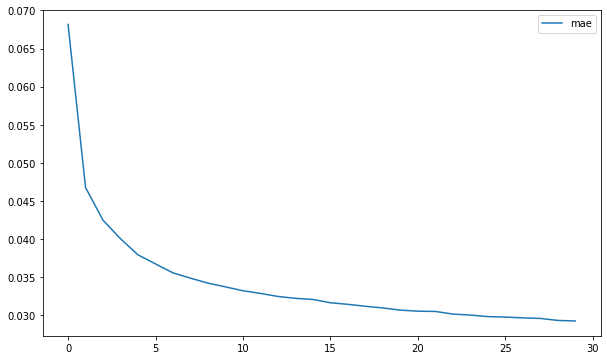

In [32]:

# plot MAE and loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['mae'], label='mae')
#plt.plot(history.history['loss'], label='loss')
plt.legend()
plt.show() 

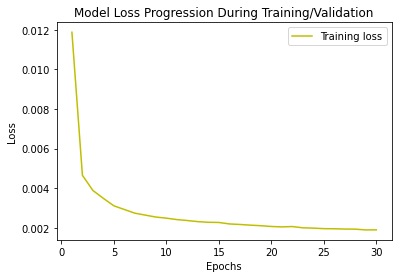

In [33]:
loss= history.history['loss']

epochs=range(1,len(loss)+1)
plt.plot(epochs, loss, 'y', label='Training loss')

plt.title('Model Loss Progression During Training/Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

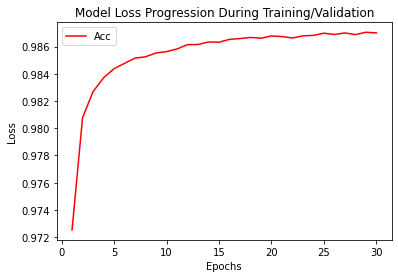

In [34]:

accuracy=history.history['accuracy']
epochs=range(1,len(loss)+1)
plt.plot(epochs,accuracy, 'r', label='Acc')
plt.title('Model Loss Progression During Training/Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

In [35]:
validation_x[0].shape

(10, 8)

In [36]:
validation_x.shape
test_data = np.reshape(validation_x[0],(1, validation_x[0].shape[0], validation_x[0].shape[1]))

In [37]:
v = X_test[11:]
v.shape

(207737, 8)

In [38]:
test = model.predict(test_data)
test

1/1 [==============================] - 0s 18ms/step


array([[0.4265467 , 0.89912754]], dtype=float32)

In [39]:
trainPredict.shape

(623230, 2)

In [40]:
from sklearn.metrics import mean_squared_error

trainScore = np.sqrt(mean_squared_error(train_y, trainPredict))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(validation_y, testPredict))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 0.04 RMSE
Test Score: 0.04 RMSE


In [41]:
#pred = np.zeros((len(testPredict),1))

#for iter in range(len(testPredict)):
#  x = testPredict[iter][0]
#  y = testPredict[iter][1]
#  pred[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


x_test = scaler.inverse_transform(v)

pred = np.zeros((len(testPredict),1))

for iter in range(len(testPredict)):
  x = testPredict[iter][0]
  y = testPredict[iter][1]
  pred[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))

  
  if ((pred[iter] >= 80) & (x_test[iter][-1] <= 20)) : 
    pred[iter] = pred[iter] - 100  
    if abs(pred[iter]) >= 5:
      pred[iter] = 0 
  

  if ((pred[iter] <= 20) & (x_test[iter][-1] >= 150)):
    pred[iter] = 100 - pred[iter]
    if abs(pred[iter]) >= 5:
        pred[iter] = 100

  

  

  #if (pred[iter] > 100):
  #  pred[iter] = pred[iter] - 100

pred1=pd.DataFrame(pred).sort_index().reset_index()

In [42]:
#pred = np.zeros((len(testPredict),1))

#for iter in range(len(testPredict)):
#  x = testPredict[iter][0]
#  y = testPredict[iter][1]
#  pred[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


In [43]:
actual = np.zeros((len(validation_y),1))

for iter in range(len(validation_y)):
  x =validation_y[iter][0]
  y =validation_y[iter][1]
  actual[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))

In [44]:
correct = 0
for i in range(5):
  correct = 0
  for iter in range(len(actual)):
    if (abs(actual[iter] - pred[iter]) <= (i+1)):
      correct+=1

  print(correct)
  print(len(actual))

  print("Precision ", i+1, ": ", correct * 100/len(actual))

152788
207737
Precision  1 :  73.54876598776337
197038
207737
Precision  2 :  94.84973788973558
205585
207737
Precision  3 :  98.96407476761482
207263
207737
Precision  4 :  99.77182687725345
207673
207737
Precision  5 :  99.96919181465026


In [45]:
# linspace
#rv = multivariate_normal ([0,0],[1,.5],[.5,1])
# Z = rv,pdf(pos)
# contour(x,y,z)

In [46]:
perc_rmse = np.sqrt(mean_squared_error(actual, pred))
print("Predicting Percentage RMSE: ", perc_rmse)

Predicting Percentage RMSE:  0.9936380873025388


In [47]:
rmse = 0
length = len(actual)
for i in range(len(actual)):
  if abs (pred[i] - actual[i]) >= 90:
    length -= 1
  else:
    rmse = rmse + pow(pred[i] - actual[i], 2)
rmse = rmse / length
rmse = math.sqrt(rmse)
print(length)
print(len(actual))
print(rmse)

207737
207737
0.9936380873025449


Text(0, 0.5, 'Percentage (%)')

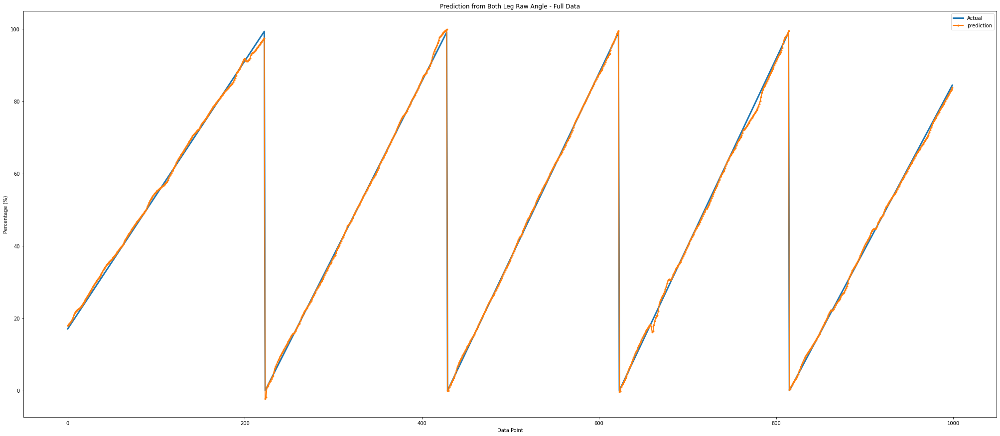

In [48]:
#plt.plot(Y[52272:52470],LShank[52272:52470],'--',label='Actual')
#plt.plot(pred,LShank,'--',label='prediction')
fig=plt.figure(figsize=(35,15))

plt.plot(actual[0:1000],'-',label='Actual', linewidth = 3)
plt.plot(pred[0:1000],'.-',label='prediction', linewidth = 2)



#plt.plot(actual[350:556],Rfoot[350:556],'.',label='Actual')
#plt.plot(pred[350:556],Rfoot[350:556],'.',label='prediction')

plt.legend()
plt.title('Prediction from Both Leg Raw Angle - Full Data')
#plt.title('Right Foot')
#plt.ylabel('Angle')
#plt.xlabel('Gait Cycle Percentage')
plt.xlabel('Data Point')
plt.ylabel('Percentage (%)')

Text(0.5, 1.0, 'Actual vs Prediction')

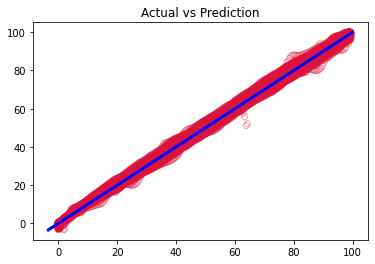

In [49]:
plt.scatter(actual, pred, facecolors='none', edgecolors='crimson',alpha=0.4)
p1 = max(max(pred), max(actual))
p2 = min(min(pred), min(actual))

ci = 0.1 * np.std([p1,p2]) / np.mean([p1,p2])

plt.plot([p1, p2], [p1, p2], 'b-', linewidth =3)
plt.title('Actual vs Prediction')

In [50]:
#predict = np.zeros((len(test_new),1))

#for iter in range(len(test_new)):
#  x = test_new[iter][0]
#  y = test_new[iter][1]
#  predict[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


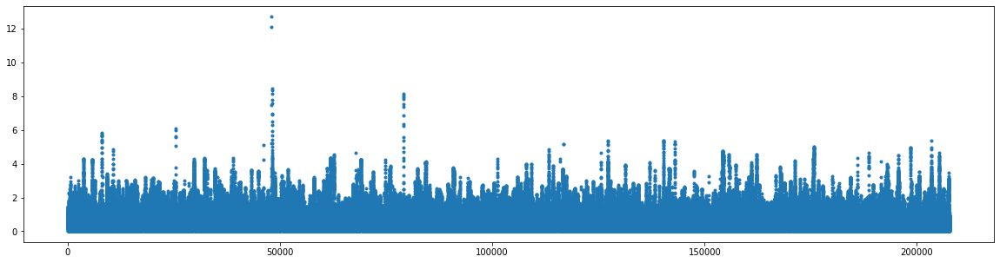

In [51]:
predfig=plt.figure(figsize=(20,5))
dif = abs(actual-pred)

plt.plot(dif,'.')


In [52]:
data_dif = pd.DataFrame(pred)
print(data_dif.to_string())

                 0
0        17.950088
1        18.274519
2        18.559993
3        18.840582
4        19.156915
5        19.597157
6        20.225381
7        20.892248
8        21.443250
9        21.829160
10       22.095886
11       22.303489
12       22.490009
13       22.695208
14       22.934412
15       23.214282
16       23.535136
17       23.908155
18       24.297254
19       24.729185
20       25.160162
21       25.574871
22       25.981608
23       26.385313
24       26.794587
25       27.215330
26       27.646854
27       28.071958
28       28.499583
29       28.905044
30       29.288477
31       29.655680
32       30.012019
33       30.359743
34       30.706018
35       31.072647
36       31.461106
37       31.869560
38       32.297864
39       32.744931
40       33.193584
41       33.611738
42       33.999919
43       34.359583
44       34.695445
45       35.012820
46       35.311510
47       35.582344
48       35.833451
49       36.082574
50       36.339716
51       36.

In [53]:
act_dif = pd.DataFrame(actual)
print(act_dif.to_string())

                0
0       17.037037
1       17.407407
2       17.777778
3       18.148148
4       18.518519
5       18.888889
6       19.259259
7       19.629630
8       20.000000
9       20.370370
10      20.740741
11      21.111111
12      21.481481
13      21.851852
14      22.222222
15      22.592593
16      22.962963
17      23.333333
18      23.703704
19      24.074074
20      24.444444
21      24.814815
22      25.185185
23      25.555556
24      25.925926
25      26.296296
26      26.666667
27      27.037037
28      27.407407
29      27.777778
30      28.148148
31      28.518519
32      28.888889
33      29.259259
34      29.629630
35      30.000000
36      30.370370
37      30.740741
38      31.111111
39      31.481481
40      31.851852
41      32.222222
42      32.592593
43      32.962963
44      33.333333
45      33.703704
46      34.074074
47      34.444444
48      34.814815
49      35.185185
50      35.555556
51      35.925926
52      36.296296
53      36.666667
54      37

In [54]:
for i in range(len(pred)):
    if (abs(actual[i]-pred[i]) > 50):
        print(i)

In [55]:
strike = pd.DataFrame(x_test[:,-1])
print(strike.to_string())

            0
0        47.0
1        48.0
2        49.0
3        50.0
4        51.0
5        52.0
6        53.0
7        54.0
8        55.0
9        56.0
10       57.0
11       58.0
12       59.0
13       60.0
14       61.0
15       62.0
16       63.0
17       64.0
18       65.0
19       66.0
20       67.0
21       68.0
22       69.0
23       70.0
24       71.0
25       72.0
26       73.0
27       74.0
28       75.0
29       76.0
30       77.0
31       78.0
32       79.0
33       80.0
34       81.0
35       82.0
36       83.0
37       84.0
38       85.0
39       86.0
40       87.0
41       88.0
42       89.0
43       90.0
44       91.0
45       92.0
46       93.0
47       94.0
48       95.0
49       96.0
50       97.0
51       98.0
52       99.0
53      100.0
54      101.0
55      102.0
56      103.0
57      104.0
58      105.0
59      106.0
60      107.0
61      108.0
62      109.0
63      110.0
64      111.0
65      112.0
66      113.0
67      114.0
68      115.0
69      116.0
70    

In [56]:
x_test[18604][:]

array([8.21143743e-01, 5.37091668e-03, 2.87417569e-01, 7.23704021e-01,
       4.27624595e-02, 1.61198274e-02, 1.00000000e+00, 1.53000000e+02])

In [57]:
print('Predict: ', pred[18604])
print('Actual: ', actual[18604])

Predict:  [65.31654916]
Actual:  [65.51724138]


In [58]:
dif[18604]

array([0.20069222])

**TEST ON OTHER SUBJECT**

In [59]:
test_file_list = []

for i in range(len(test_sub)):
    test_file_list.append(pd.read_excel(excel_path + test_sub[i], sheet_name='Sheet1'))

In [60]:
## if there are multiple subject to test:
# random.shuffle(test_file_list)

all_test = pd.concat(test_file_list, axis = 0, ignore_index = True)

In [61]:
all_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 173247 entries, 0 to 173246
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   l_ph_hip      173247 non-null  float64
 1   l_ph_ank      173247 non-null  float64
 2   l_ph_fo       173247 non-null  float64
 3   r_ph_hip      173247 non-null  float64
 4   r_ph_ank      173247 non-null  float64
 5   r_ph_fo       173247 non-null  float64
 6   n_lgrf        173247 non-null  float64
 7   n_r_grf       173247 non-null  float64
 8   n_lcop        173247 non-null  float64
 9   n_rcop        173247 non-null  float64
 10  perc_new      173247 non-null  float64
 11  st_sw_phase   173247 non-null  int64  
 12  strike_frame  173247 non-null  int64  
dtypes: float64(11), int64(2)
memory usage: 17.2 MB


In [62]:
cycle = 0
cycle_list = []

start = 0

for i in range(len(all_test) - 1):
    if (all_test['perc_new'][i+1] == 0):
        cycle += 1
        cycle_list.append(all_test.iloc[start:i])
        start = i+1

random.shuffle(cycle_list)
test_table = pd.concat(cycle_list, axis=0, ignore_index=True)

test_table

,l_ph_hip,l_ph_ank,l_ph_fo,r_ph_hip,r_ph_ank,r_ph_fo,n_lgrf,n_r_grf,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.020713,0.033012,0.965077,0.169775,0.767260,0.400769,0.818195,0.048525,-0.000560,0.178573,0.000000,0,1
1,0.021752,0.042838,0.967727,0.159677,0.764605,0.379168,0.819920,0.067255,-0.000399,0.206549,0.432900,0,2
2,0.022719,0.052400,0.970003,0.147022,0.762203,0.360902,0.819848,0.088901,-0.000261,0.235765,0.865801,0,3
3,0.023620,0.061474,0.971899,0.130861,0.760016,0.345677,0.817708,0.112870,-0.000144,0.265721,1.298701,0,4
4,0.024462,0.069868,0.973417,0.109924,0.758008,0.333033,0.813258,0.138335,-0.000048,0.295794,1.731602,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
172254,0.006669,0.976930,0.737245,0.195834,0.774881,0.021046,0.871196,0.000000,-0.000931,0.048188,97.196262,1,209
172255,0.007572,0.979880,0.723931,0.192888,0.771641,0.025361,0.878508,0.000000,-0.000723,0.063840,97.663551,1,210
172256,0.008310,0.982762,0.710977,0.189562,0.768677,0.029669,0.884370,0.000000,-0.000540,0.081617,98.130841,1,211
172257,0.008889,0.985538,0.698640,0.185751,0.765963,0.033916,0.888404,0.000000,-0.000382,0.101556,98.598131,1,212


In [63]:
test_table = test_table.drop(drop_list, axis = 1)
test_table

,l_ph_hip,l_ph_fo,r_ph_hip,r_ph_fo,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.020713,0.965077,0.169775,0.400769,-0.000560,0.178573,0.000000,0,1
1,0.021752,0.967727,0.159677,0.379168,-0.000399,0.206549,0.432900,0,2
2,0.022719,0.970003,0.147022,0.360902,-0.000261,0.235765,0.865801,0,3
3,0.023620,0.971899,0.130861,0.345677,-0.000144,0.265721,1.298701,0,4
4,0.024462,0.973417,0.109924,0.333033,-0.000048,0.295794,1.731602,0,5
...,...,...,...,...,...,...,...,...,...
172254,0.006669,0.737245,0.195834,0.021046,-0.000931,0.048188,97.196262,1,209
172255,0.007572,0.723931,0.192888,0.025361,-0.000723,0.063840,97.663551,1,210
172256,0.008310,0.710977,0.189562,0.029669,-0.000540,0.081617,98.130841,1,211
172257,0.008889,0.698640,0.185751,0.033916,-0.000382,0.101556,98.598131,1,212


In [64]:
x_test = test_table
x_test = x_test.drop(['perc_new'], axis=1)
scaler2 = MinMaxScaler()
x_test_scaled = scaler2.fit_transform(x_test)
x_test_scaled = pd.DataFrame(x_test_scaled)

encode_gait_percentage(test_table, 'perc_new')
y_test = source_table[["X","Y"]]
y_test

data_x_test = x_test_scaled


In [65]:
#data_y_test = y_test.values.reshape(-1, 2)
data_y_test = y_test.values

In [66]:
test_x, test_y = convert_data(data_x_test, data_y_test, look_back, fore_cast)

In [67]:
check_point = data_x_test[11:]
check_point.shape

(172248, 8)

In [68]:
crossPredict = model.predict(test_x)

5383/5383 [==============================] - 15s 3ms/step


In [69]:
score = np.sqrt(mean_squared_error(test_y, crossPredict))
print('Test Score: %.3f RMSE' % (score))

Test Score: 0.988 RMSE


In [70]:

check_point_test = scaler.inverse_transform(check_point)

predict = np.zeros((len(crossPredict),1))

for iter in range(len(crossPredict)):
  x = crossPredict[iter][0]
  y = crossPredict[iter][1]
  predict[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


  if ((predict[iter] >= 80) & (check_point_test[iter][-1] <= 20)) :
    predict[iter] = predict[iter] - 100
    
    if abs(predict[iter]) >= 5:
        predict[iter] = 0


  if ((predict[iter] <= 20) & (check_point_test[iter][-1] >= 150)):
     predict[iter] = 100 - predict[iter]
     if abs(predict[iter]) >= 5:
         predict[iter] = 100

In [71]:
actual2 = np.zeros((len(test_y),1))

for iter in range(len(test_y)):
  x = test_y[iter][0]
  y = test_y[iter][1]
  actual2[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))

In [72]:
correct = 0
for i in range(5):
  correct = 0
  for iter in range(len(actual2)):
    #if (abs(actual[iter] - pred[iter]) <= (i+1)) or (actual[iter]>98) or(actual[iter]<3):
      #correct+=1
      if (abs(actual2[iter] - predict[iter]) <= (i+1)):
        correct+=1

  print(correct)
  print(len(actual2))

  print("Precision ", i+1, ": ", correct * 100/len(actual2))

3120
172248
Precision  1 :  1.8113417862616692
6149
172248
Precision  2 :  3.5698527704240397
9161
172248
Precision  3 :  5.318494264084343
12162
172248
Precision  4 :  7.060749616831545
15256
172248
Precision  5 :  8.8569968882077


In [73]:
perc_rmse_cross = np.sqrt(mean_squared_error(actual2, predict))
print("Predicting Percentage RMSE: ", perc_rmse_cross)

Predicting Percentage RMSE:  40.82611086011362


In [74]:
rmse = 0
length = len(actual2)
for i in range(len(actual2)):

    rmse = rmse + pow(predict[i] - actual2[i], 2)
rmse = rmse / length
rmse = math.sqrt(rmse)
print(length)
print(len(actual2))
print(rmse)

172248
172248
40.82611086011375


Text(0.5, 1.0, 'Actual vs Prediction')

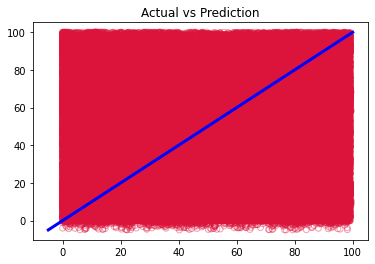

In [75]:
plt.scatter(actual2, predict, facecolors='none', edgecolors='crimson',alpha=0.4)
p1 = max(max(predict), max(actual2))
p2 = min(min(predict), min(actual2))

ci = 0.1 * np.std([p1,p2]) / np.mean([p1,p2])

plt.plot([p1, p2], [p1, p2], 'b-', linewidth =3)
plt.title('Actual vs Prediction')

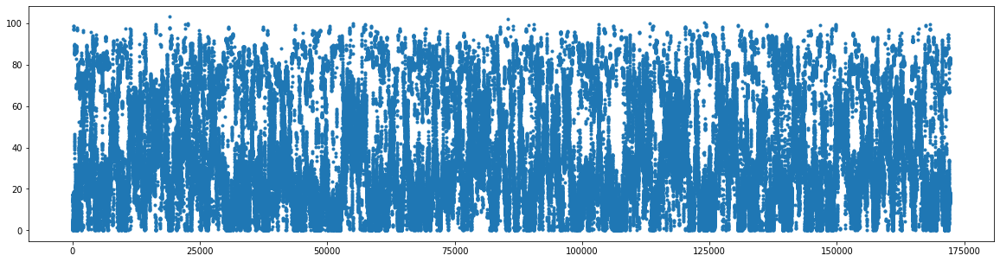

In [76]:
predfig=plt.figure(figsize=(20,5))
dif = abs(actual2-predict)

plt.plot(dif,'.')